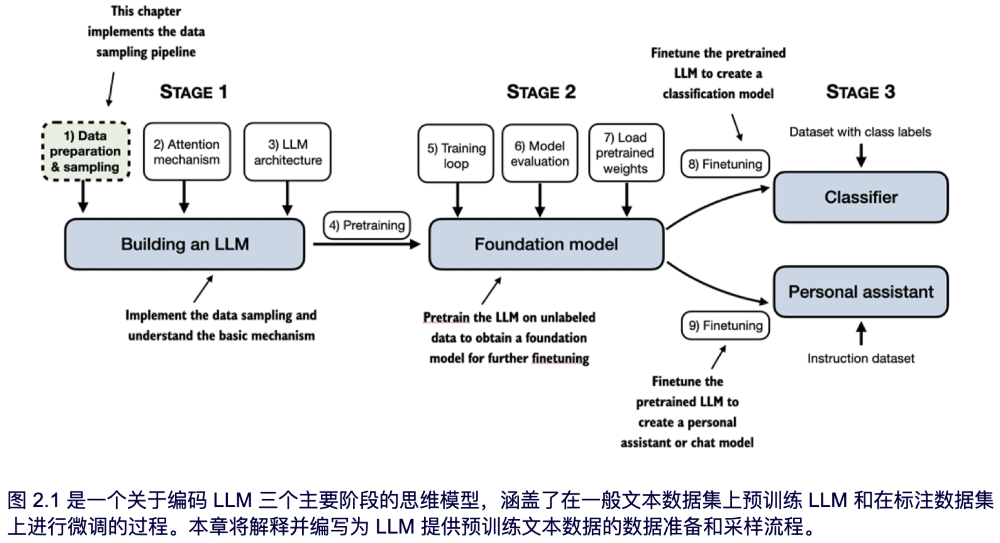
# 1.处理文本数据 

In [1]:
with open ("the-verdict.txt","r", encoding='utf-8') as f:
    raw_text = f.read()

print(f"Totle length of text is {len(raw_text)}")

Totle length of text is 20479


## 1.1 分词

In [2]:
import re
with open ("the-verdict.txt","r",encoding = "utf-8") as f:
    raw_text = f.read()

print(raw_text[:50])
len(raw_text)

I HAD always thought Jack Gisburn rather a cheap g


20479

正则表达：空白字符（\s）、逗号和句点（[,.]）单独拆分出来

In [3]:
processed = re.split(r'([,.?!:;()_"\']|--|\s)', raw_text)# \s是空格  注意 r'([]|--|\s)'
processed = [token.strip() for token in processed if token.strip()] #.strip()是滤空格
print(len(processed))
print(processed[:30])

4690
['I', 'HAD', 'always', 'thought', 'Jack', 'Gisburn', 'rather', 'a', 'cheap', 'genius', '--', 'though', 'a', 'good', 'fellow', 'enough', '--', 'so', 'it', 'was', 'no', 'great', 'surprise', 'to', 'me', 'to', 'hear', 'that', ',', 'in']


## 1.2 tokens -> token IDs

In [4]:
all_words = sorted(set(processed)) ## 建立词汇表
vocal_size = len(all_words)
print(vocal_size)
vocab = {token:integer for integer, token in enumerate(all_words)} #建立词汇与编码关联

for i, item in enumerate(vocab.items()):
    print(item)
    if(i > 50):
        break



1130
('!', 0)
('"', 1)
("'", 2)
('(', 3)
(')', 4)
(',', 5)
('--', 6)
('.', 7)
(':', 8)
(';', 9)
('?', 10)
('A', 11)
('Ah', 12)
('Among', 13)
('And', 14)
('Are', 15)
('Arrt', 16)
('As', 17)
('At', 18)
('Be', 19)
('Begin', 20)
('Burlington', 21)
('But', 22)
('By', 23)
('Carlo', 24)
('Chicago', 25)
('Claude', 26)
('Come', 27)
('Croft', 28)
('Destroyed', 29)
('Devonshire', 30)
('Don', 31)
('Dubarry', 32)
('Emperors', 33)
('Florence', 34)
('For', 35)
('Gallery', 36)
('Gideon', 37)
('Gisburn', 38)
('Gisburns', 39)
('Grafton', 40)
('Greek', 41)
('Grindle', 42)
('Grindles', 43)
('HAD', 44)
('Had', 45)
('Hang', 46)
('Has', 47)
('He', 48)
('Her', 49)
('Hermia', 50)
('His', 51)


In [5]:
class Simple_tokenizer:
    def __init__(self, vocab):
        self.str_to_int = vocab
        self.int_to_str = {i:s for s,i in vocab.items()}
    
    def encode(self, text):
        processed = re.split(r'([,.;:?!_"\']|--|\s)', text)
        processed = [token.strip() for token in processed if token.strip()]
        ids = [self.str_to_int[s] for s in processed]
        return ids
    
    def decode(self, ids):
        text = " ".join([self.int_to_str[i] for i in ids])
        text = re.sub(r'\s+([,.?!;:"\'()])', r'\1', text)
        return text
    
#A 将词汇表作为类属性存储，以方便在 encode 和 decode 方法中访问
#B 创建一个反向词汇表，将token ID 映射回原始的文本token
#C 将输入文本转换为token ID
#D 将token ID 还原为文本
#E 在指定的标点符号前去掉空格

In [6]:
tokenizer = Simple_tokenizer(vocab)
text = """"It's the last he painted, you know," Mrs. Gisburn said with pardonable pride."""
ids = tokenizer.encode(text)
ids
text = tokenizer.decode(ids)
text

'" It\' s the last he painted, you know," Mrs. Gisburn said with pardonable pride.'

## 1.3 添加特殊上下文token 
处理未知单词 支持两个新的token：<|unk|> 和 <|endoftext|>
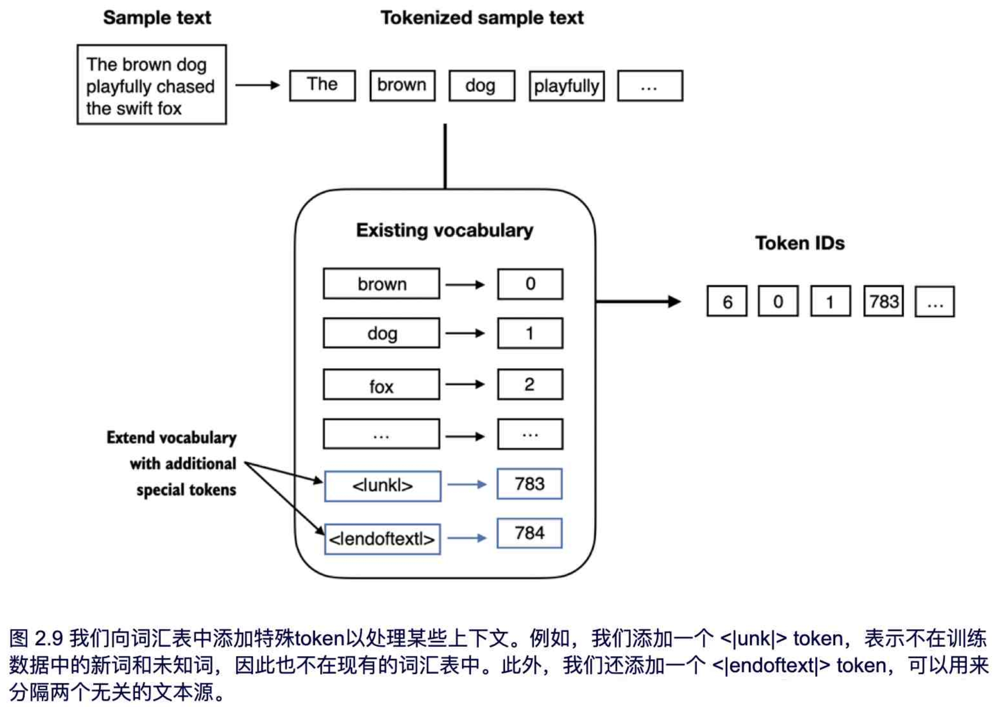

In [7]:
all_tokens = sorted(list(set(processed)))
print(len(all_tokens))
all_tokens.extend(['<|endoftext|>', '<|unk|>'])
print(len(all_tokens))
vocab = {token:integer for integer, token in enumerate(all_tokens)}
print(len(vocab.items()))
for i, item in enumerate(list(vocab.items())[-5:]):
  	print(item)

1130
1132
1132
('younger', 1127)
('your', 1128)
('yourself', 1129)
('<|endoftext|>', 1130)
('<|unk|>', 1131)


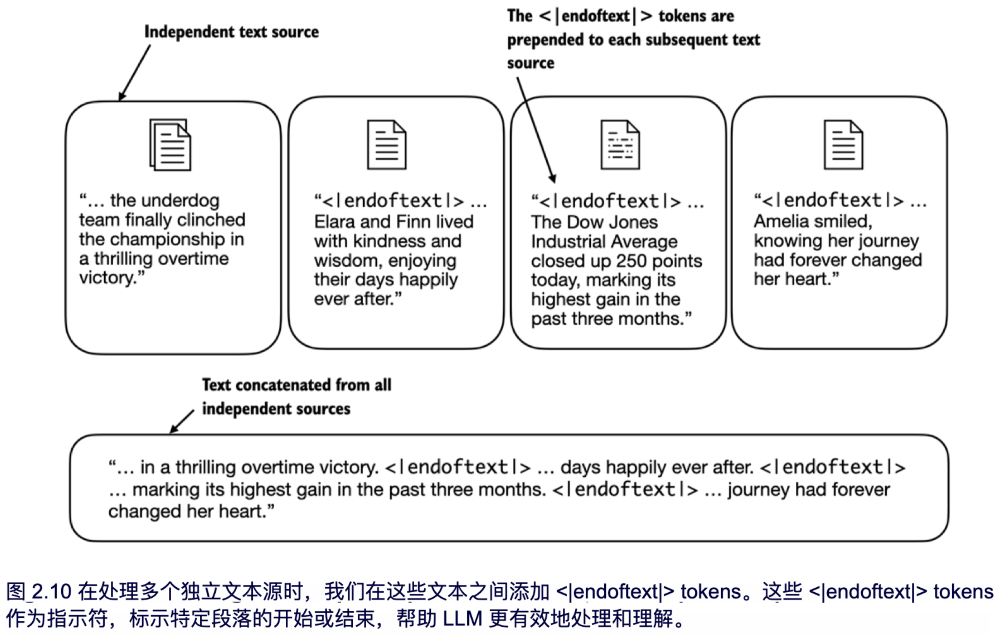

In [8]:
class Simple_tokenizer_v2:
    def __init__(self, vocab):
        self.str_to_int = vocab
        self.int_to_str = {i:s for s,i in vocab.items()}
    
    def encode(self, text):
        processed = re.split(r'([,.;:?!_"\']|--|\s)', text)
        processed = [token.strip() for token in processed if token.strip()]
        processed = [item if item in self.str_to_int else '<|unk|>' for item in processed]
        ids = [self.str_to_int[s] for s in processed]
        return ids
    
    def decode(self, ids):
        text = " ".join([self.int_to_str[i] for i in ids])
        text = re.sub(r'\s+([,.?!;:"\'()])', r'\1', text)
        return text

In [9]:
text_test = "hello, who are you?"
print(Simple_tokenizer_v2(vocab).encode(text_test))
print(Simple_tokenizer_v2(vocab).encode('Hello, do you like tea? <|endoftext|> In the sunlit terraces of the palace.'))
print(Simple_tokenizer_v2(vocab).decode(Simple_tokenizer_v2(vocab).encode('Hello, do you like tea? <|endoftext|> In the sunlit terraces of the palace.')))

[1131, 5, 1097, 169, 1126, 10]
[1131, 5, 355, 1126, 628, 975, 10, 1130, 55, 988, 956, 984, 722, 988, 1131, 7]
<|unk|>, do you like tea? <|endoftext|> In the sunlit terraces of the <|unk|>.


## 1.4 字节对编码

In [10]:
import tiktoken
print(tiktoken.__version__)

0.10.0


In [11]:
tokenizer = tiktoken.get_encoding("gpt2")
text = "Hello, do you like tea? <|endoftext|> In the sunlit terraces of someunknownPlace."
integreters = tokenizer.encode(text, allowed_special={"<|endoftext|>"})
print(integreters)

[15496, 11, 466, 345, 588, 8887, 30, 220, 50256, 554, 262, 4252, 18250, 8812, 2114, 286, 617, 34680, 27271, 13]


In [12]:
strings = tokenizer.decode(integreters)
strings

'Hello, do you like tea? <|endoftext|> In the sunlit terraces of someunknownPlace.'

述BPE分词器能够正确编码和解码未知词汇，例如“someunknownPlace”。BPE分词器可以处理任何未知词汇。
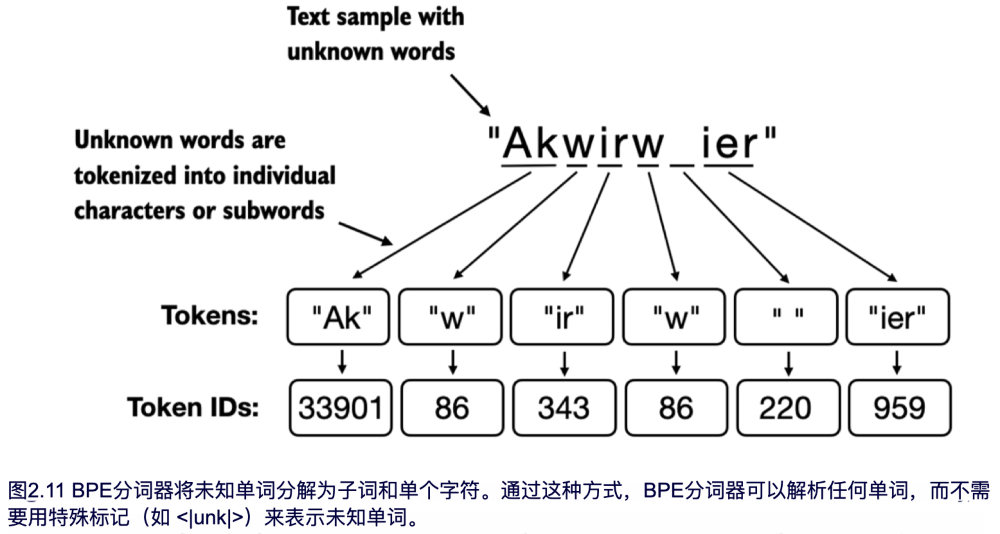

In [13]:
encodes = tokenizer.encode("Akwirw ier")
print(encodes)
decodes = tokenizer.decode(encodes)
print(decodes)

[33901, 86, 343, 86, 220, 959]
Akwirw ier


## 1.5 使用滑动窗口进行数据采样  
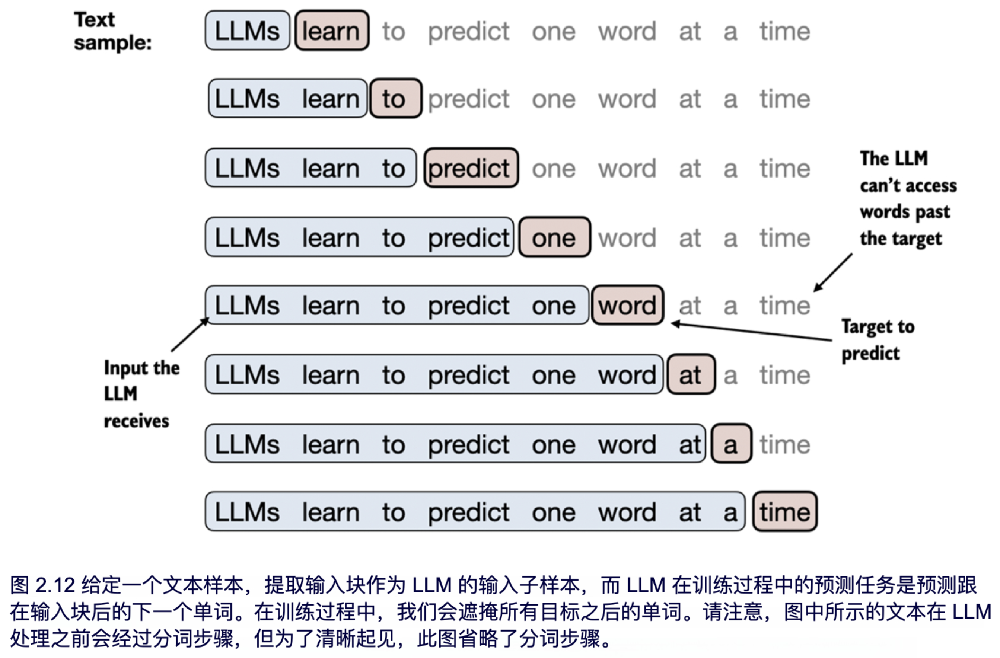

In [17]:
with open ('the-verdict.txt','r',encoding='utf-8') as f:
    raw_text = f.read()
encode_text = tokenizer.encode(raw_text)
print(len(encode_text))
enc_example = encode_text[50:]

5145


In [19]:
# 创建input -> target对
context_length = 8
for i in range(1 , context_length + 1):
    context = enc_example[:i]
    target = enc_example[i]
    print(f"Context: {context} -> Target: {target}")
    print(tokenizer.decode(context), "->", tokenizer.decode([target]))

Context: [290] -> Target: 4920
 and ->  established
Context: [290, 4920] -> Target: 2241
 and established ->  himself
Context: [290, 4920, 2241] -> Target: 287
 and established himself ->  in
Context: [290, 4920, 2241, 287] -> Target: 257
 and established himself in ->  a
Context: [290, 4920, 2241, 287, 257] -> Target: 4489
 and established himself in a ->  vill
Context: [290, 4920, 2241, 287, 257, 4489] -> Target: 64
 and established himself in a vill -> a
Context: [290, 4920, 2241, 287, 257, 4489, 64] -> Target: 319
 and established himself in a villa ->  on
Context: [290, 4920, 2241, 287, 257, 4489, 64, 319] -> Target: 262
 and established himself in a villa on ->  the


这样一个个对应Target不够高效，采用tensor来处理  
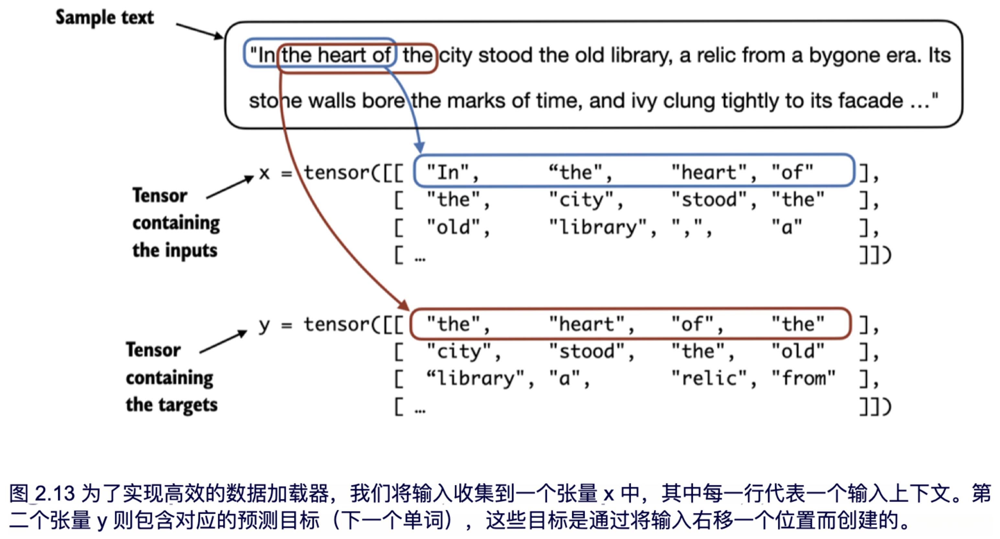

In [37]:
import torch
from torch.utils.data import Dataset, DataLoader
#A:对文本进行编码
#B:创建input -> target对
#C:返回数据集长度和指定行
class GPTDatasetv1(Dataset):
    def __init__(self, text, tokenizer, context_length, stride):
        self.input_ids = []
        self.target_ids = []
        token_ids = tokenizer.encode(text)
        for i in range(0, len(token_ids)-context_length, stride):
            self.input_ids.append(torch.tensor(token_ids[i : i + context_length]))
            self.target_ids.append(torch.tensor(token_ids[i+1 : i+1+context_length]))
    
    def __len__(self):
        return(len(self.input_ids))
    
    def __getitem__(self, index):
        return self.input_ids[index], self.target_ids[index]

#根据数据集建立Dataloader

def create_dataloader(text, tokenizer, batch_size=4, max_length=256, stride=128, shuffle=True, drop_last=True, num_workers=0):
    dataset = GPTDatasetv1(text, tokenizer, context_length=max_length,stride=stride)
    dataloader = DataLoader(dataset=dataset, 
                            batch_size=batch_size,
                            shuffle=shuffle,
                            drop_last=drop_last,
                            num_workers=num_workers)
    
    return dataloader
        

In [52]:
## 测试dataloader
with open ("the-verdict.txt", "r", encoding='utf-8') as f:
    raw_text = f.read()

dataloader = create_dataloader(raw_text, tokenizer, batch_size=2, max_length=4,stride=2,shuffle=False)
dataiter = iter(dataloader)
print(next(dataiter))
print(next(dataiter))


[tensor([[  40,  367, 2885, 1464],
        [2885, 1464, 1807, 3619]]), tensor([[ 367, 2885, 1464, 1807],
        [1464, 1807, 3619,  402]])]
[tensor([[ 1807,  3619,   402,   271],
        [  402,   271, 10899,  2138]]), tensor([[ 3619,   402,   271, 10899],
        [  271, 10899,  2138,   257]])]


In [54]:
dataloader = create_dataloader(raw_text, tokenizer, batch_size=8, max_length=4, stride=4, shuffle=False)
inputs, targets = next(iter(dataloader))
print(f"Inputs:{inputs} \n Targets:{targets}")

Inputs:tensor([[   40,   367,  2885,  1464],
        [ 1807,  3619,   402,   271],
        [10899,  2138,   257,  7026],
        [15632,   438,  2016,   257],
        [  922,  5891,  1576,   438],
        [  568,   340,   373,   645],
        [ 1049,  5975,   284,   502],
        [  284,  3285,   326,    11]]) 
 Targets:tensor([[  367,  2885,  1464,  1807],
        [ 3619,   402,   271, 10899],
        [ 2138,   257,  7026, 15632],
        [  438,  2016,   257,   922],
        [ 5891,  1576,   438,   568],
        [  340,   373,   645,  1049],
        [ 5975,   284,   502,   284],
        [ 3285,   326,    11,   287]])


## 1.6 词嵌入层Embedding Layer  
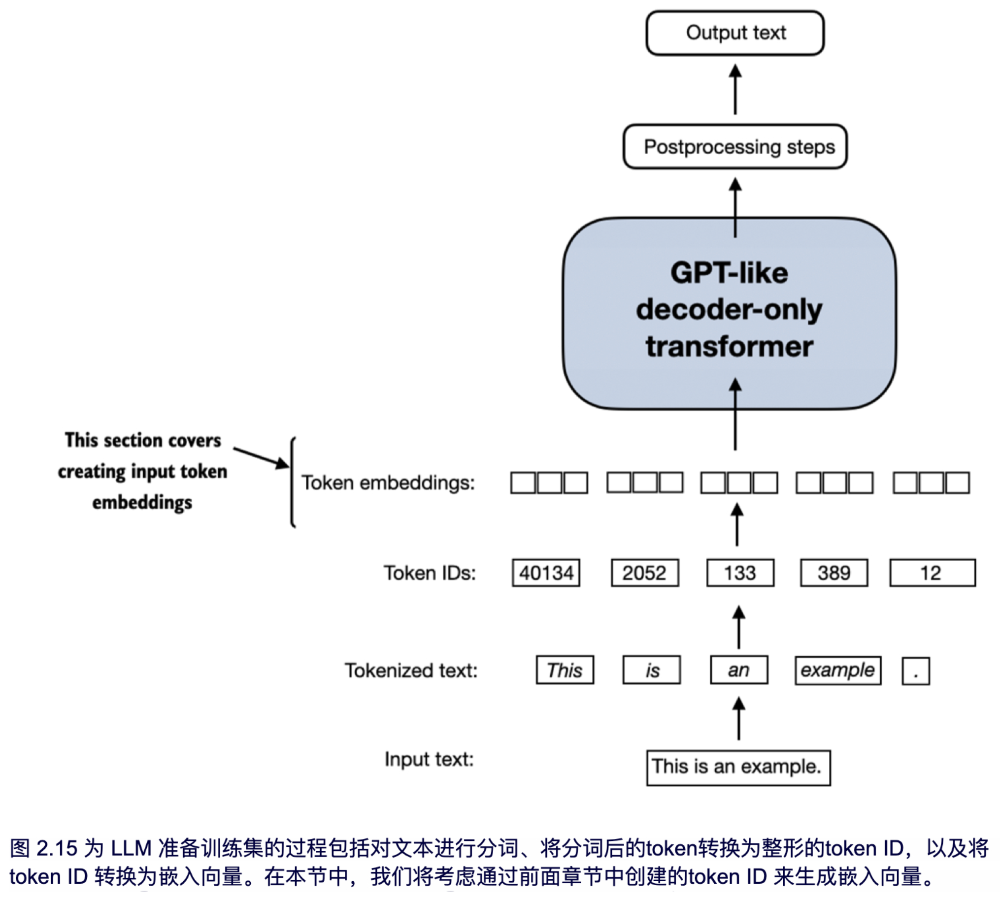

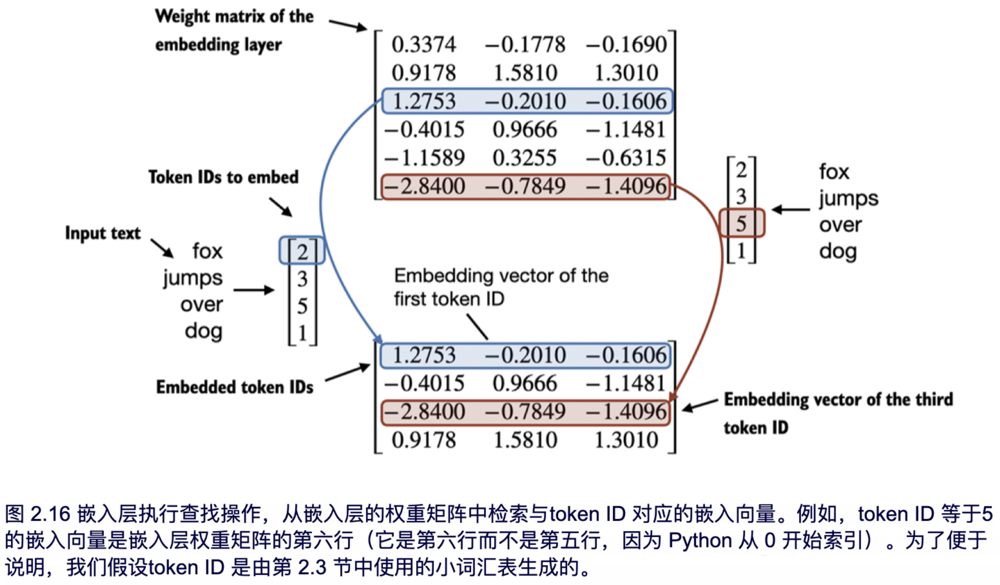
'''
换句话说，嵌入层本质上是一个查找功能，通过token ID 从嵌入层的权重矩阵中检索行。
'''

In [ ]:
## Example for embedding layer
import torch
input_ids = torch.tensor([2,3,5,1])
vocab_size = 6
output_dim = 3
torch.manual_seed(123)
embedding_layer = torch.nn.Embedding(vocab_size, output_dim)
print(embedding_layer.weight)
print(embedding_layer(input_ids))

Parameter containing:
tensor([[ 0.3374, -0.1778, -0.1690],
        [ 0.9178,  1.5810,  1.3010],
        [ 1.2753, -0.2010, -0.1606],
        [-0.4015,  0.9666, -1.1481],
        [-1.1589,  0.3255, -0.6315],
        [-2.8400, -0.7849, -1.4096]], requires_grad=True)
tensor([[ 1.2753, -0.2010, -0.1606],
        [-0.4015,  0.9666, -1.1481],
        [-2.8400, -0.7849, -1.4096],
        [ 0.9178,  1.5810,  1.3010]], grad_fn=<EmbeddingBackward0>)


## 1.7 位置编码  

无位置编码： 
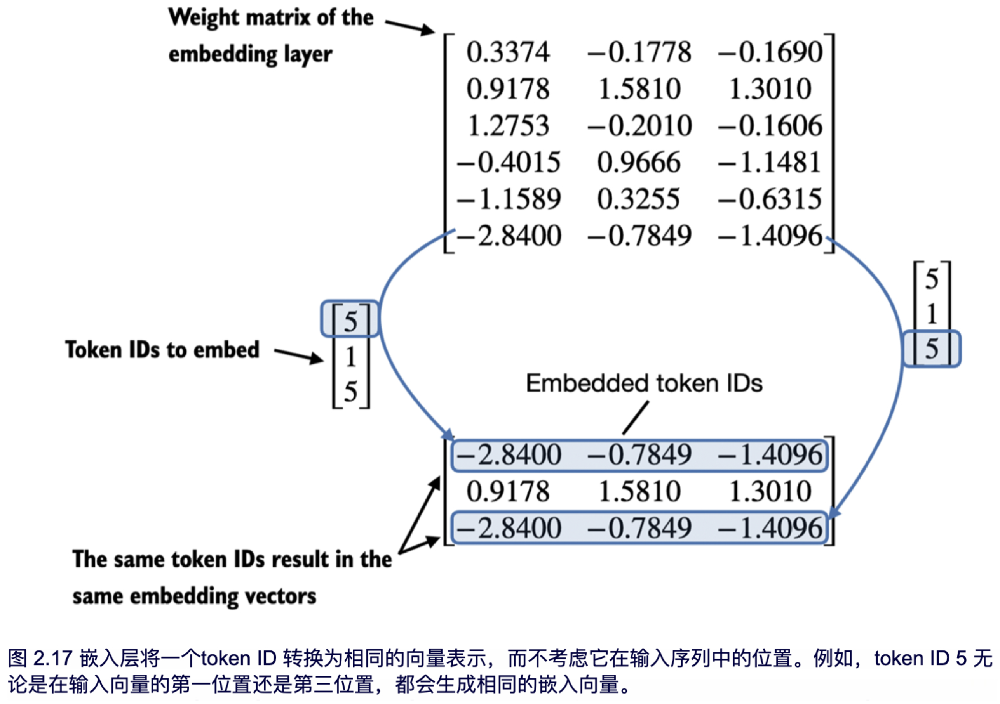 

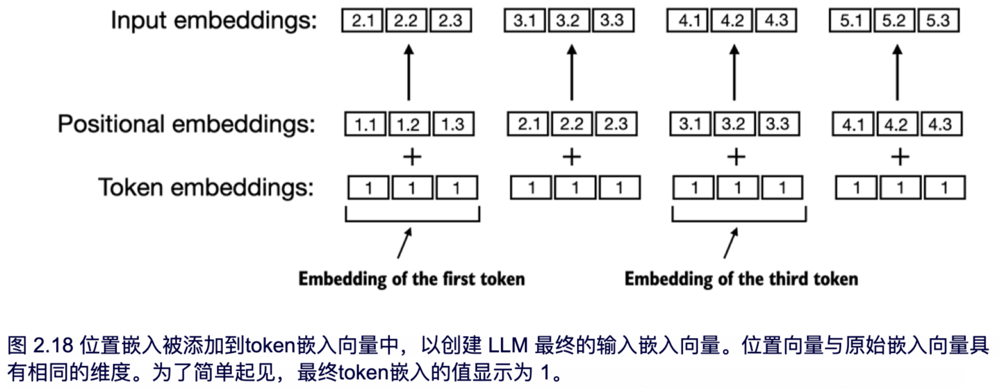  
关注token在序列中的绝对位置不同，相对位置嵌入强调的是token之间的相对位置或距离。这意味着模型学习的是“相隔多远”的关系，而不是“在什么确切位置”。这样的优势在于，即使模型在训练时没有接触过不同的长度，它也可以更好地适应各种长度的序列。

这两种类型的位置嵌入旨在增强 LLM 理解token顺序与关系的能力，从而确保在预测时能对上下文具有更准确的感知。选择哪种类型的位置嵌入通常取决于特定的应用和所处理数据的性质。

OpenAI 的 GPT 模型使用绝对位置嵌入，这些嵌入在训练过程中进行优化，而不是像原始 Transformer 模型中的位置编码那样是固定或预定义的。这个优化过程属于模型训练的一部分，我们将在本书后面的章节中实现。目前，让我们创建初始位置嵌入，以便为接下来的章节准备 LLM 输入。

In [62]:
vocab_size = 50257
output_dim = 256
token_embedding_layer = torch.nn.Embedding(vocab_size, output_dim)
dataloader = create_dataloader(text=raw_text, tokenizer=tokenizer, batch_size=8, max_length=4, stride=4, shuffle=False)
dataiter = iter(dataloader)
input_ids,output_ids = next(dataiter)
print(f"Input_ids: {input_ids}\n The shape of input_ids:{input_ids.shape}")

Input_ids: tensor([[   40,   367,  2885,  1464],
        [ 1807,  3619,   402,   271],
        [10899,  2138,   257,  7026],
        [15632,   438,  2016,   257],
        [  922,  5891,  1576,   438],
        [  568,   340,   373,   645],
        [ 1049,  5975,   284,   502],
        [  284,  3285,   326,    11]])
 The shape of input_ids:torch.Size([8, 4])


In [63]:
token_embedding = token_embedding_layer(input_ids)
print(token_embedding.shape)

torch.Size([8, 4, 256])


对于 GPT 模型所使用的绝对嵌入方法，我们只需创建另一个嵌入层，其维度与 token_embedding_layer 的维度相同

In [66]:
context_length = 4
pos_embedding_layer = torch.nn.Embedding(context_length, output_dim)
pos_embedding = pos_embedding_layer(torch.arange(context_length))
pos_embedding.shape

torch.Size([4, 256])

In [68]:
input_embedding = token_embedding + pos_embedding
input_embedding.shape

torch.Size([8, 4, 256])

我们创建的 input_embeddings，如下图所示，现在可作为LLM的核心模块的输入嵌入。  
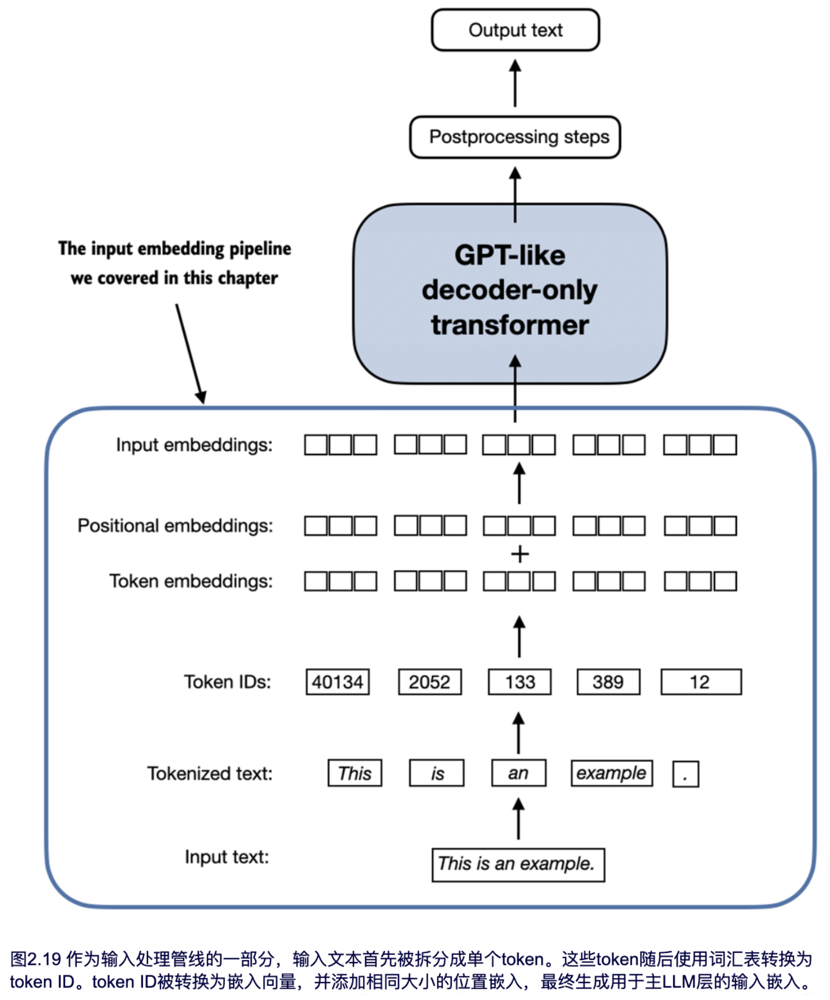

## Summary:
* LLM 需要将文本数据转换为数值向量，这称之为嵌入，因为它们无法处理原始文本。嵌入将离散数据（如单词或图像）转化为连续的向量空间，从而使其能够与神经网络操作兼容。
* 作为第一步，原始文本被分解为token，这些token可以是单词或字符。然后，这些token被转换为整数表示，称为token ID。
* 可以添加特殊token，如 <|unk|> 和 <|endoftext|>，以增强模型的理解能力，并处理各种上下文，例如未知单词或无关文本之间的边界分隔。
* 用于像 GPT-2 和 GPT-3 这样的 LLM 的字节对编码（BPE）分词器，可以通过将未知单词分解为子词单元或单个字符，高效地处理这些单词。
* 我们在分词后的文本数据上采用滑动窗口方法，以生成用于 LLM 训练的输入-目标对。
* 在 PyTorch 中，嵌入层作为一种查找操作，用于检索与token ID 对应的向量。生成的嵌入向量提供了token的连续表示，这在训练像 LLM 这样的深度学习模型时至关重要。
* 虽然token嵌入为每个token提供了一致的向量表示，但它们并没有考虑token在序列中的位置。为了解决这个问题，存在两种主要类型的位置嵌入：绝对位置嵌入和相对位置嵌入。OpenAI 的 GPT 模型采用绝对位置嵌入，这些位置嵌入向量会与token嵌入向量相加，并在模型训练过程中进行优化。